# Model #1 – použití nástroje Teachable Machine

---

## Základní informace o modelu
- Model byl trénován pomocí nástroje [Teachable Machine](https://teachablemachine.withgoogle.com/) jako standard image model se základním nastavením – počet epoch byl 50, velikost batche 16 a míra učení 0.001.
- Framework – Keras 3.8.0
- Trénink probíhal lokálně, po dobu cca 5 minut.
- [Trénovací dataset](https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/tree/6b20314b216d994978396a979f9ae7e29cafa04a/trenovaci_dataset) obsahuje **250 obrázků**.
> Poznámka: Nebylo záměrem mít přesně 250 obrázků.
- Dataset nemá vyvážené zastoupení tříd, ale nemá to zásadní vliv na kvalitu.
- Originální rozlišení obrázků je vysoké – 3056×3056 px.
- Data se předzpracovávají změnou velikosti na 224x224 px a normalizují se.


---


## Popis klasifikačních tříd
Model rozlišuje celkem **6 tříd**. Ukázalo se, že je potřeba rozlišovat mezi kostkami s černými okraji (samolepkovými) a kostkami s žádnými okraji (bezsamolepkovými). Dále je potřeba rozlišit, zda je strana složená, nebo ne. Zde bylo nutné přidat mezistupeň, jelikož nebylo vhodné mít v jedné třídě strany, kde je např. jen jedna samolepka jiná než ostatní a strany, kde jsou barvy úplně zpřeházené.

| Třída (label)     | Stav strany  | Typ kostky  | Počet trénovacích dat |
|-----------|-----------|------------|----------------------|
| 0  | složená | samolepková (černé okraje) | 12
| 1  | skoro složená | samolepková (černé okraje) | 48
| 2  | rozložená  | samolepková (černé okraje) | 31
| 3  | složená | bezsamolepková | 25
| 4  | skoro složená | bezsamolepková | 89
| 5  | rozložená | bezsamolepková | 45

> Poznámka: V praxi se třída „skoro složená“ vždy klasifikuje jako nesložená.

Níže jsou uvedeny ukázky jednotlivých tříd z [trénovacích dat](https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/tree/6b20314b216d994978396a979f9ae7e29cafa04a/trenovaci_dataset).
<table>
  <tr>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/stickerless_slozena/20250429_123108.jpg?raw=true" width="150"/><br/>
      <p>Třída 0</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/stickerless_skoro_slozena/20250429_124520.jpg?raw=true"width="150"/><br/>
      <p>Třída 1</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/stickerless_rozlozena/20250429_125653.jpg?raw=true" width="150"/><br/>
      <p>Třída 2</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/sticker_slozena/20250521_193257.jpg?raw=true" width="150"/><br/>
      <p>Třída 3</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/sticker_skoro_slozena/20250521_194258.jpg?raw=true" width="150"/><br/>
      <p>Třída 4</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/trenovaci_dataset/sticker_rozlozena/20250521_194529.jpg?raw=true" width="150"/><br/>
      <p>Třída 5</p>
    </td>
  </tr>
</table>

Pro úplnost uvedeme, že jsme pro pokus vybrali kostky **MoYu RS3M 2020** a **Yuxin Kylin V2 M**.


---


## Labely a testovací datasety
Labely se získávají z názvů souborů, první znak je číslo třídy.

Použili jsme dva hlavní testovací datasety. Oba mají shodný počet obrázků v jednotlivých třídách – deset v každé z nich, celkem tedy 60 obrázků.
1.   [První testovací dataset]("https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/tree/6b20314b216d994978396a979f9ae7e29cafa04a/testovaci_dataset_mobil") obsahuje obrázky vyfocené stejným zařízením jako tréninková data.

<table>
  <tr>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/0_20250505_193144.jpg?raw=true" width="150"/><br/>
      <p>Třída 0</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/1_20250505_192932.jpg?raw=true"width="150"/><br/>
      <p>Třída 1</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/2_20250505_193443.jpg?raw=true" width="150"/><br/>
      <p>Třída 2</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/3_20250526_121731.jpg?raw=true" width="150"/><br/>
      <p>Třída 3</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/4_20250526_122024.jpg?raw=true" width="150"/><br/>
      <p>Třída 4</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_mobil/5_20250526_122447.jpg?raw=true" width="150"/><br/>
      <p>Třída 5</p>
    </td>
  </tr>
</table>

2.   [Druhý testovací dataset](https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/tree/6b20314b216d994978396a979f9ae7e29cafa04a/testovaci_dataset_webkamera) obsahuje obrázky vyfocené webkamerou notebooku.

<table>
  <tr>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/0_foto_20250526_113335.jpg?raw=true" width="150"/><br/>
      <p>Třída 0</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/1_foto_20250526_114805.jpg?raw=true"width="150"/><br/>
      <p>Třída 1</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/2_foto_20250526_120013.jpg?raw=true" width="150"/><br/>
      <p>Třída 2</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/3_foto_20250526_113622.jpg?raw=true" width="150"/><br/>
      <p>Třída 3</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/4_foto_20250526_115338.jpg?raw=true" width="150"/><br/>
      <p>Třída 4</p>
    </td>
    <td align="center">
      <img src="https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/blob/main/testovaci_dataset_webkamera/5_foto_20250526_114044.jpg?raw=true" width="150"/><br/>
      <p>Třída 5</p>
    </td>
  </tr>
</table>

Mezi oběma sadami je viditelný propastný rozdíl ve kvalitě.

---

## Omezení a slabiny
Model je citlivý na světelné podmínky. Pokud je pouze jedna samolepka nesprávně umístěná, může to způsobit chybnou klasifikaci. Často zaměňuje žlutou za bílou, žlutou za oranžovou a oranžovou za červenou.
> Poznámka: Jak můžete vidět na obrázku tříd (3 a 4) u trénovacích dat, i pro člověka by bylo rozlišení těchto dvou obrázku v horších světelných podmínkách obtížné. Pokoušeli jsme se trénovací data nejprve složit z obrázků, kde jsou i různá pozadí a kostka je v různých vzdálenostech od kamery. Přestože jsme dat měli podobný počet, výsledky byly tristní.

---

---

# Importy

In [1]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
from keras.models import load_model
from pathlib import Path
from google.colab import drive
from sklearn.metrics import classification_report, confusion_matrix

import os
import glob
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
import skimage.io
import h5py
import seaborn as sns

# JavaScriptové funkce

In [2]:
# Funkce pro převod JavaScriptového objektu na OpenCV obrázek
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScriptový objekt obsahující obrázek z webkamery
  Returns:
          img: OpenCV BGR obrázek
  """
  # Dekódování base64 obrázku
  image_bytes = b64decode(js_reply.split(',')[1])
  # Převod bajtů na numpy pole
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # Dekódování numpy pole do OpenCV BGR obrázku
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# Funkce pro převod OpenCV obdélníkového (bounding box) obrázku na base64 řetězec pro překrytí na video stream
def bbox_to_bytes(bbox_array):
  """
  Params:
          bbox_array: Numpy pole (pixely) obsahující obdélník k překrytí na video stream.
  Returns:
        bytes: Base64 řetězec obrázku
  """
  # Převod pole na PIL obrázek
  bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
  iobuf = io.BytesIO()
  # Formátování bbox jako PNG pro návrat
  bbox_PIL.save(iobuf, format='png')
  # Formátování návratového řetězce
  bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return bbox_bytes


def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Změňte výšku výstupu tak, aby odpovídala prvku videa
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Počkejte na kliknutí na tlačítko Capture
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      const videoWidth = video.videoWidth;
      const videoHeight = video.videoHeight;

      // Určete velikost čtverce, který chcete oříznout (nejmenší rozměr videa)
      const size = Math.min(videoWidth, videoHeight);

      // Vypočítejte souřadnice pro oříznutí středového čtverce
      const offsetX = (videoWidth - size) / 2;
      const offsetY = (videoHeight - size) / 2;

      // Nastavte rozměry plátna pro čtverec
      canvas.width = size;
      canvas.height = size;

      // Ořízněte video na středový čtverec
      const context = canvas.getContext('2d');
      context.drawImage(video, offsetX, offsetY, size, size, 0, 0, size, size);

      // Zastavte stream a odstraňte video
      stream.getVideoTracks()[0].stop();
      div.remove();

      return canvas.toDataURL('image/jpeg', quality);
    }
  ''')
  display(js)

  # Získejte data fotografie
  data = eval_js('takePhoto({})'.format(quality))
  # Získejte obrázek ve formátu OpenCV
  img = np.asarray(js_to_image(data) )

  return img


# Jednotlivé funkce

In [3]:
def load_and_preprocess_image(image_path):
    """Načte obrázek, změní velikost, normalizuje a připraví ho pro model."""
    image = cv2.imread(str(image_path))
    image = cv2.resize(image, (224, 224), interpolation=cv2.INTER_AREA)
    preprocessed = np.asarray(image, dtype=np.float32).reshape(1, 224, 224, 3)
    preprocessed = (preprocessed / 127.5) - 1
    return image, preprocessed

In [4]:
def predict_image(model, image):
    """Vrátí index predikované třídy a její pravděpodobnost."""
    prediction = model.predict(image)
    index = np.argmax(prediction)
    confidence = prediction[0][index]
    return index, confidence

In [5]:
def get_true_label_from_filename(image_path):
    """Získá label z názvu obrázku."""
    return int(os.path.basename(image_path)[0])

In [6]:
def show_image(image, title):
    """Zobrazí obrázek."""
    plt.imshow(image[..., ::-1])
    plt.title(title)
    plt.axis('off')
    plt.show()

In [7]:
def show_confusion_matrix(cm):
    """Funkce vykreslí barevně matici záměn."""
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Greens", cbar=False)
    plt.xlabel("Předpovězené štítky")
    plt.ylabel("Skutečné štítky")
    plt.title("Matice záměn")
    plt.tight_layout()
    plt.show()

# Načtení souborů z GitHubu
Možnost změnit cestu k druhé sadě obrázků (z webkamery).

In [12]:
!git clone https://github.com/MartinKilb/Rozpoznavani-Rubikovy-kostky/

# image_paths = glob.glob("Rozpoznavani-Rubikovy-kostky/testovaci_dataset_mobil/*.jpg")
image_paths = glob.glob("Rozpoznavani-Rubikovy-kostky/testovaci_dataset_webkamera/*.jpg")

model_path = "Rozpoznavani-Rubikovy-kostky/model.h5"
labels_path = "Rozpoznavani-Rubikovy-kostky/labels.txt"

fatal: destination path 'Rozpoznavani-Rubikovy-kostky' already exists and is not an empty directory.


# Hlavní kód

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


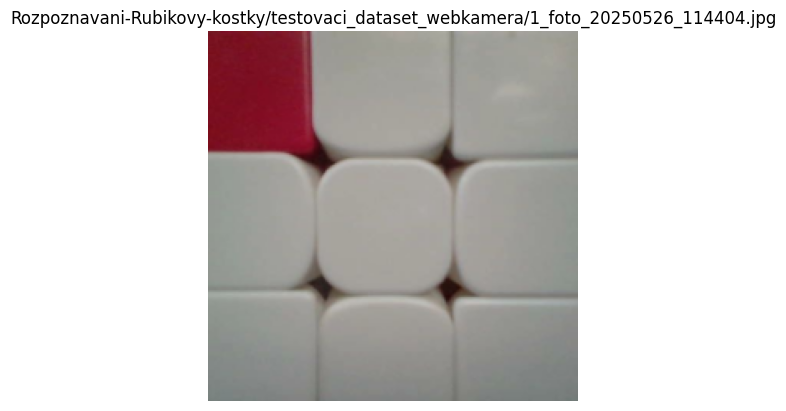

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 99.79% – 🟩 Správně klasifikováno


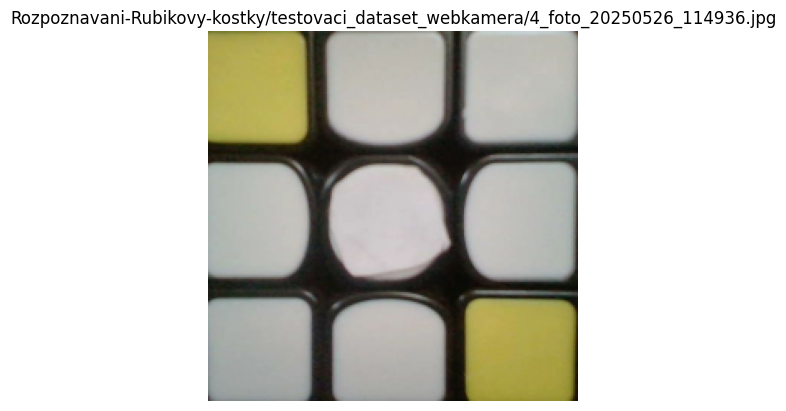

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 98.36% – 🟩 Správně klasifikováno


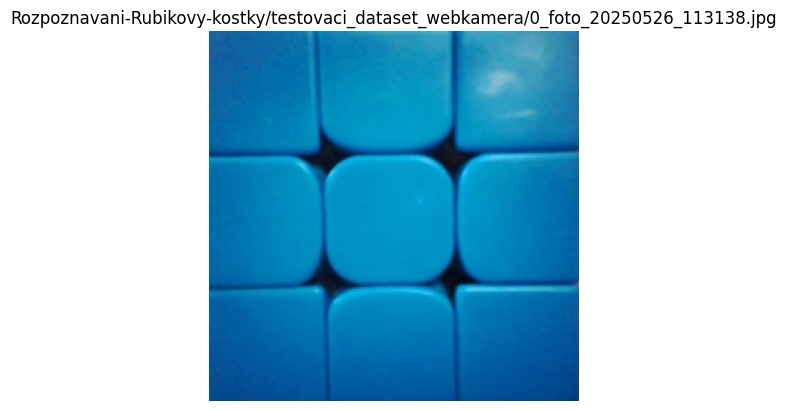

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


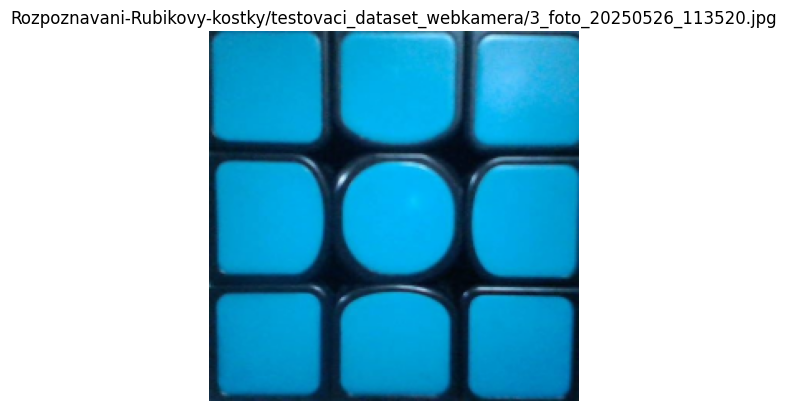

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 71.58% – 🟩 Správně klasifikováno


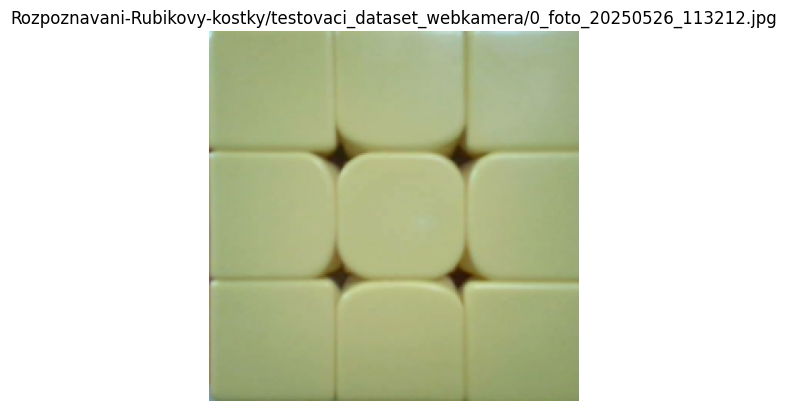

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 99.99% – 🟩 Správně klasifikováno


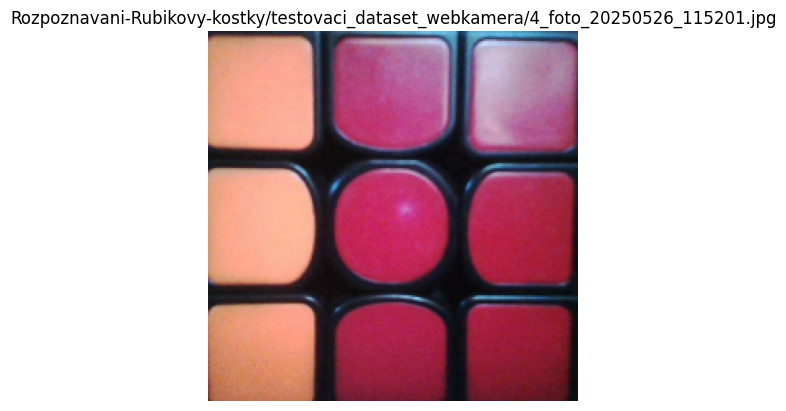

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 78.30% – 🟩 Správně klasifikováno


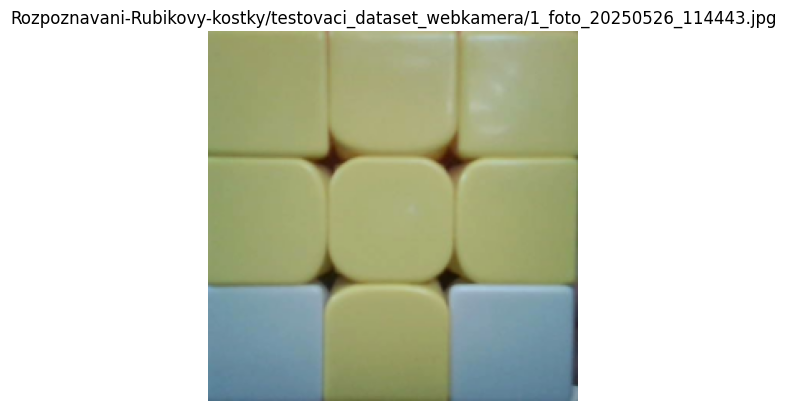

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 99.64% – 🟩 Správně klasifikováno


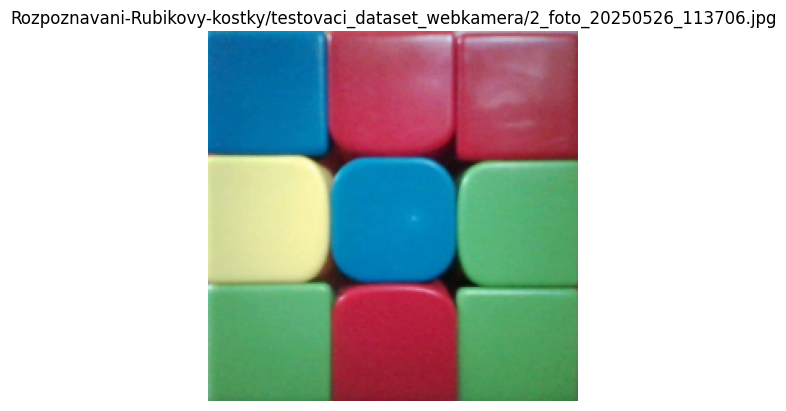

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 89.77% – 🟩 Správně klasifikováno


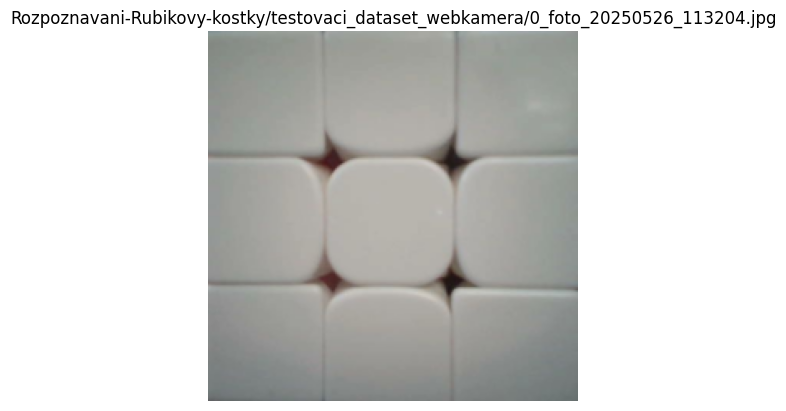

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 99.99% – 🟩 Správně klasifikováno


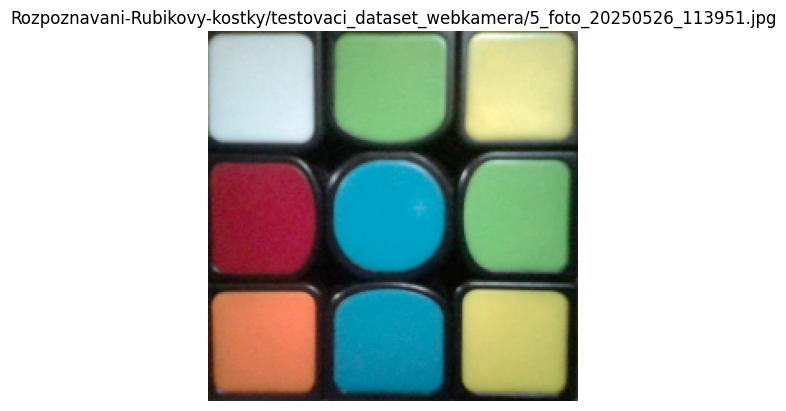

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 94.83% – 🟩 Správně klasifikováno


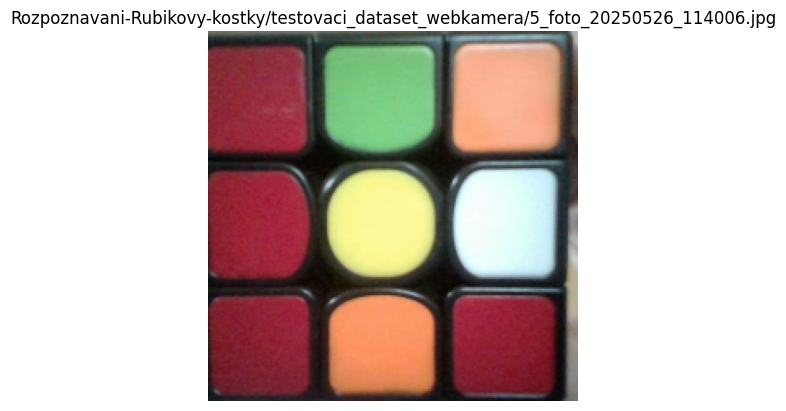

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
Správná třída: 5
Predikovaná třída 4 s pravděpodobností 96.51% – 🟥 Špatně klasifikováno


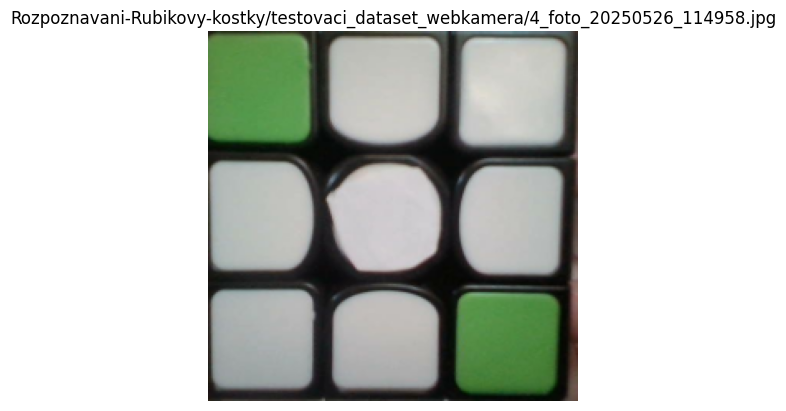

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 99.82% – 🟩 Správně klasifikováno


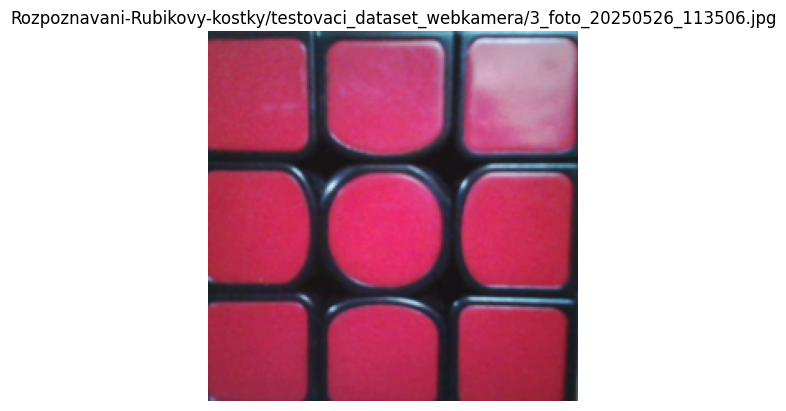

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Správná třída: 3
Predikovaná třída 4 s pravděpodobností 90.72% – 🟥 Špatně klasifikováno


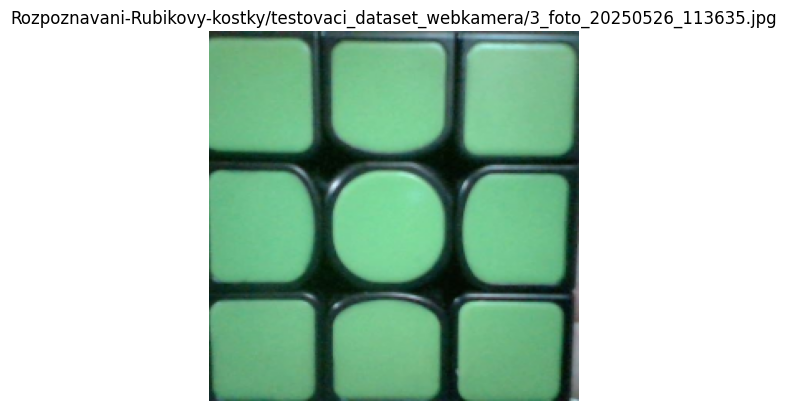

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 99.96% – 🟩 Správně klasifikováno


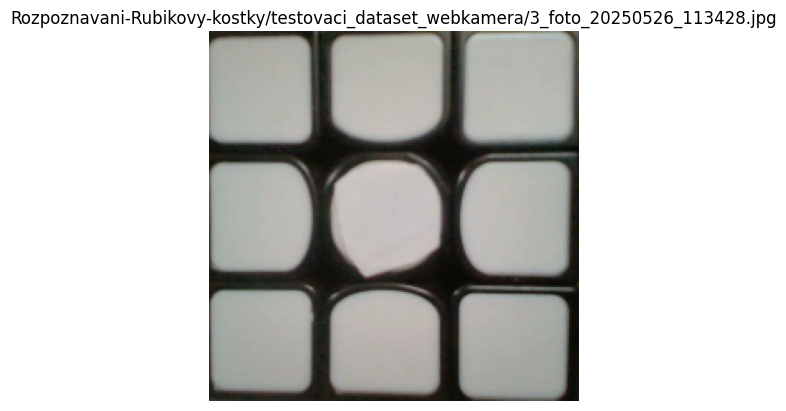

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 93.94% – 🟩 Správně klasifikováno


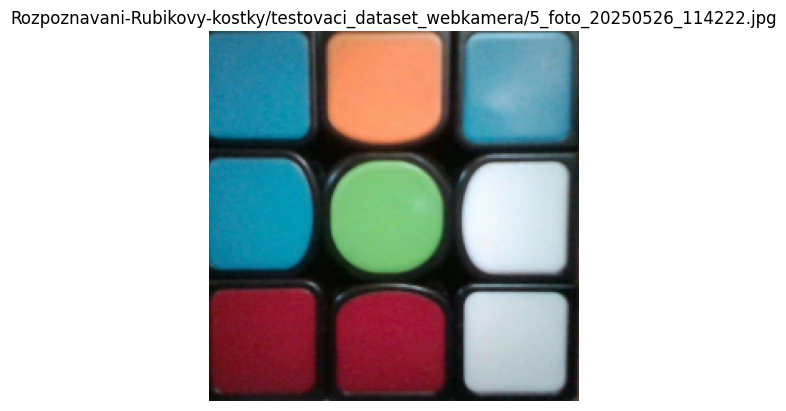

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 90.01% – 🟩 Správně klasifikováno


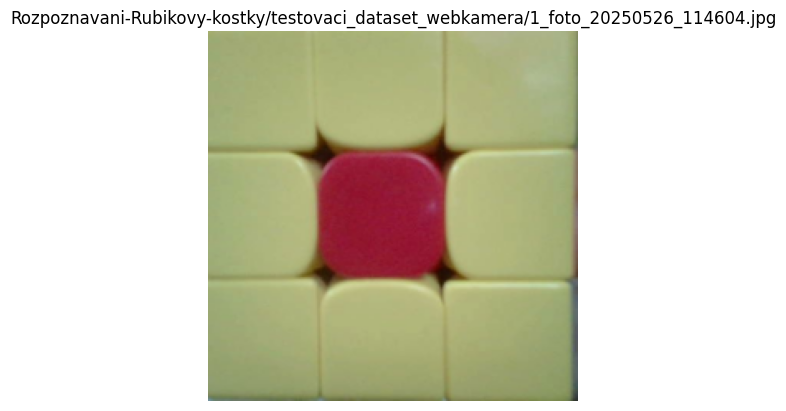

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 99.89% – 🟩 Správně klasifikováno


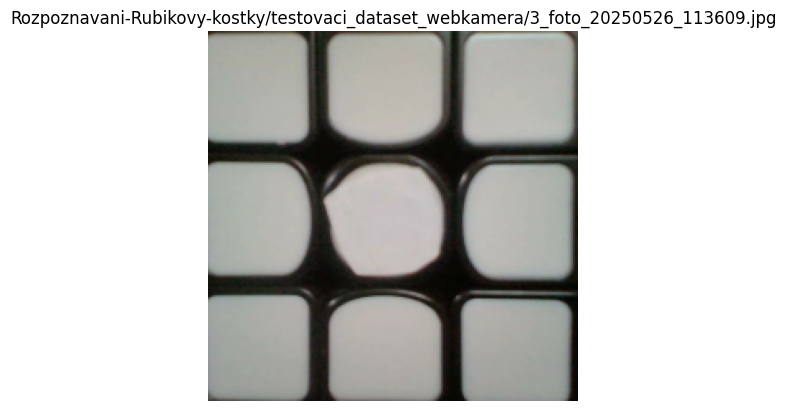

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 99.82% – 🟩 Správně klasifikováno


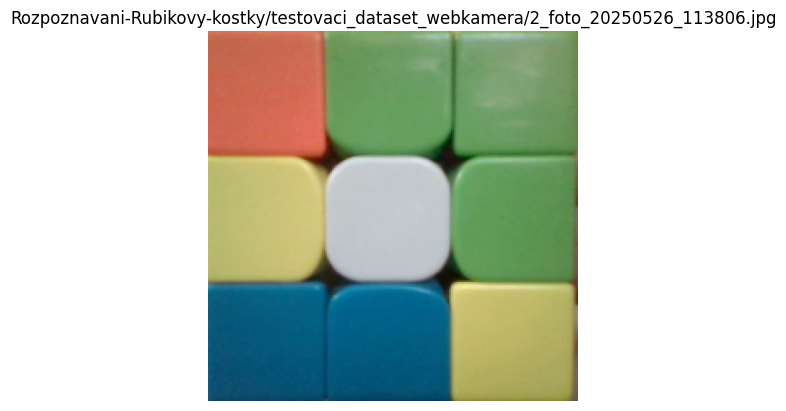

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 77.87% – 🟩 Správně klasifikováno


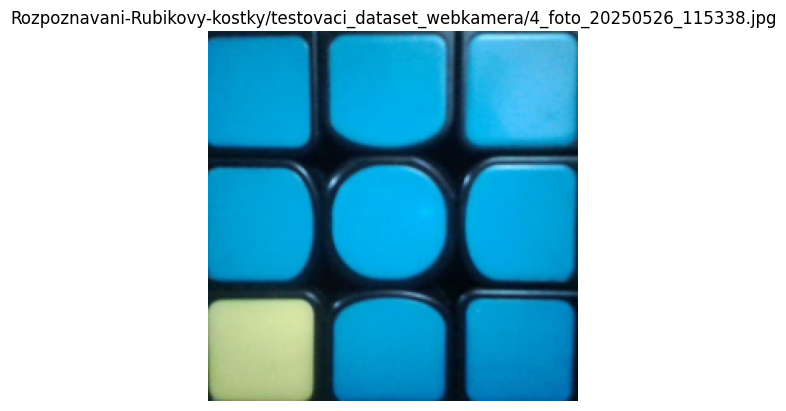

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 99.54% – 🟩 Správně klasifikováno


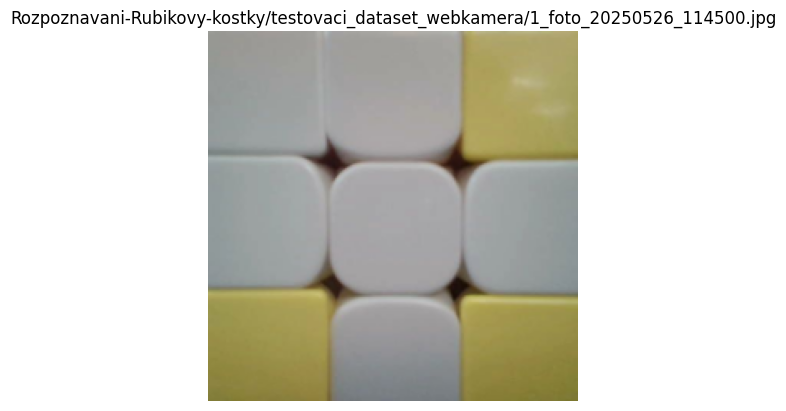

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 95.31% – 🟩 Správně klasifikováno


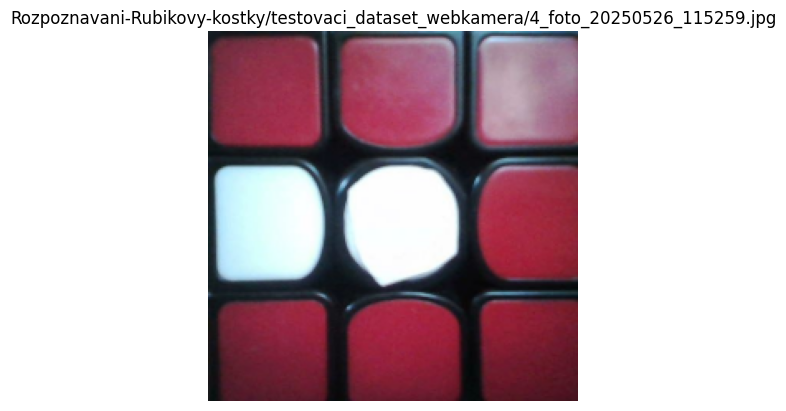

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 94.66% – 🟩 Správně klasifikováno


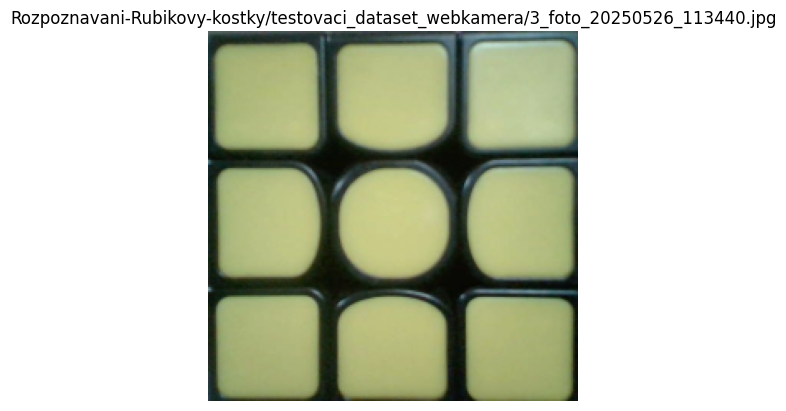

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 99.80% – 🟩 Správně klasifikováno


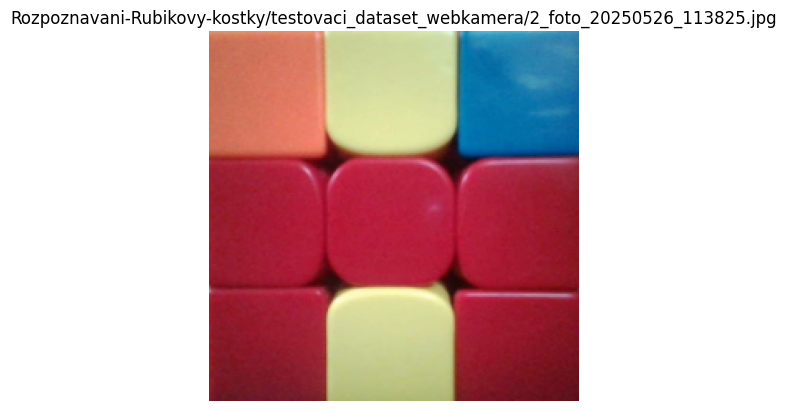

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 99.70% – 🟩 Správně klasifikováno


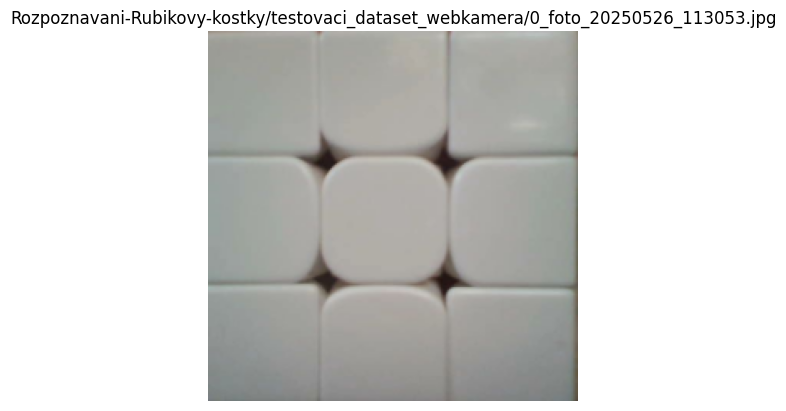

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 99.99% – 🟩 Správně klasifikováno


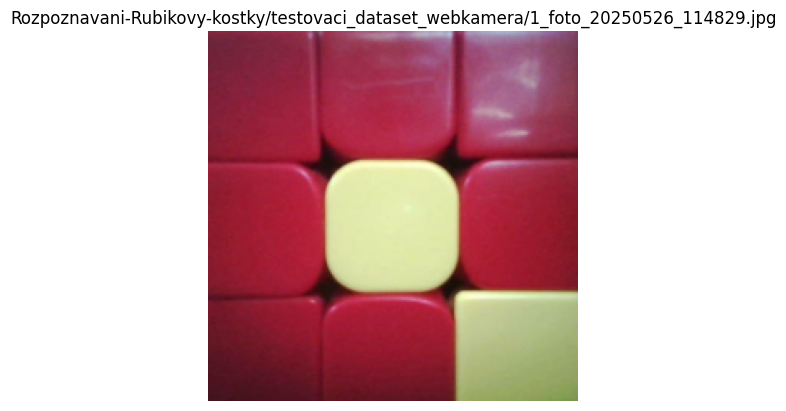

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 67.76% – 🟩 Správně klasifikováno


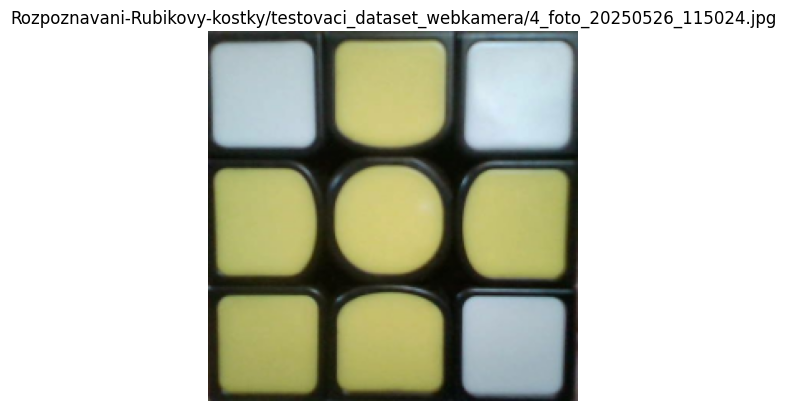

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 95.51% – 🟩 Správně klasifikováno


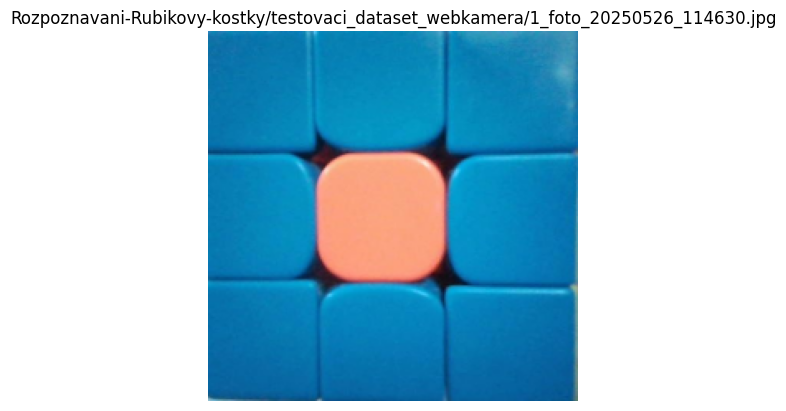

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 99.85% – 🟩 Správně klasifikováno


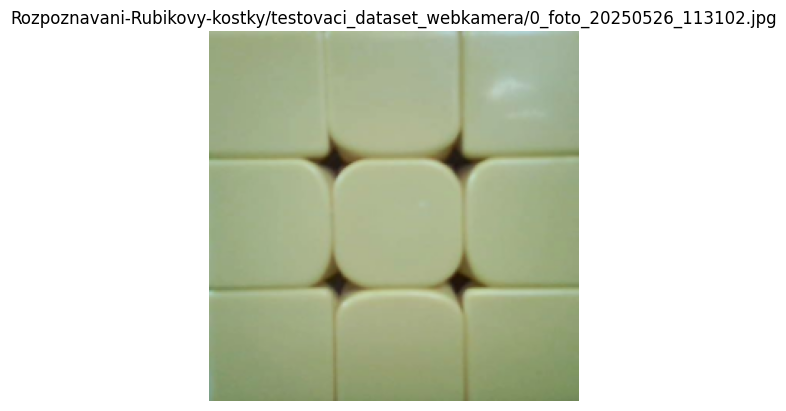

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


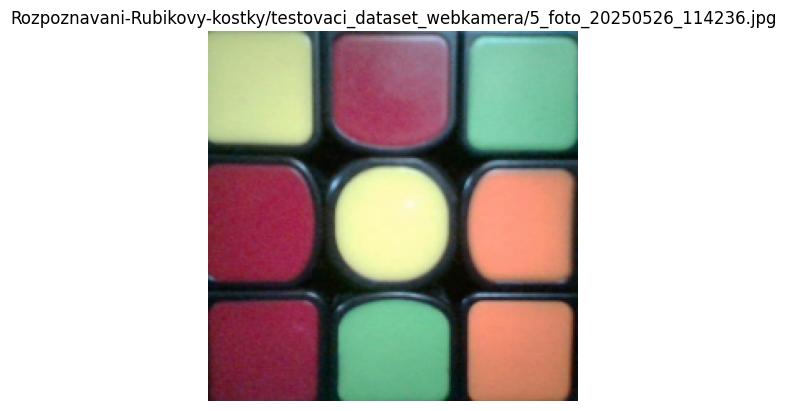

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 66.19% – 🟩 Správně klasifikováno


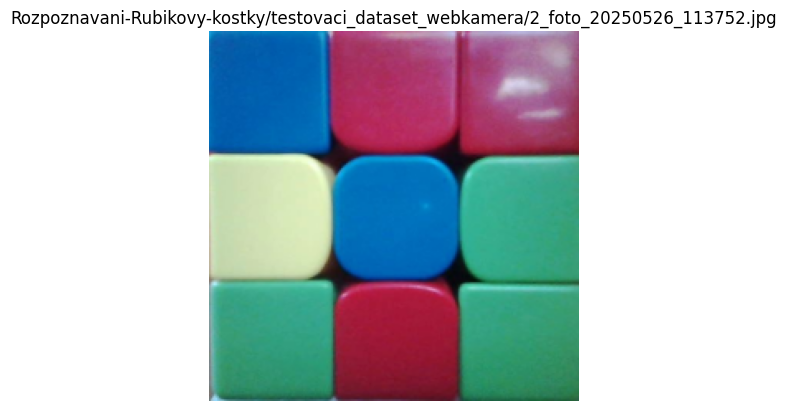

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 95.68% – 🟩 Správně klasifikováno


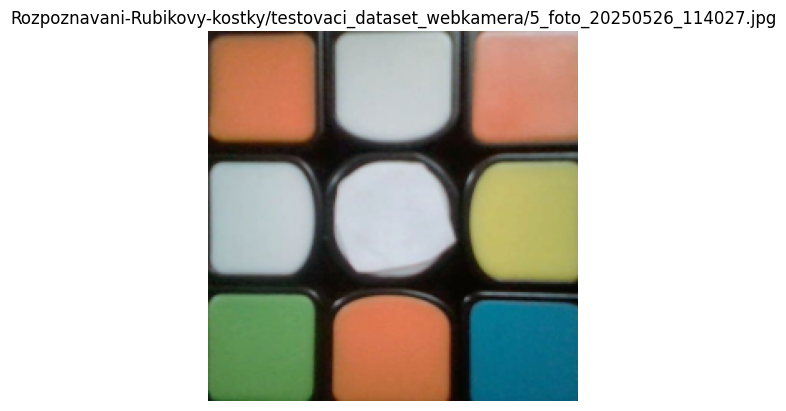

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 90.42% – 🟩 Správně klasifikováno


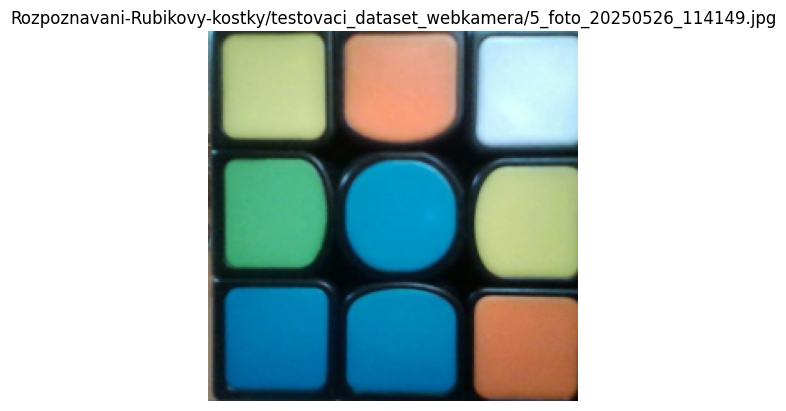

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Správná třída: 5
Predikovaná třída 4 s pravděpodobností 85.01% – 🟥 Špatně klasifikováno


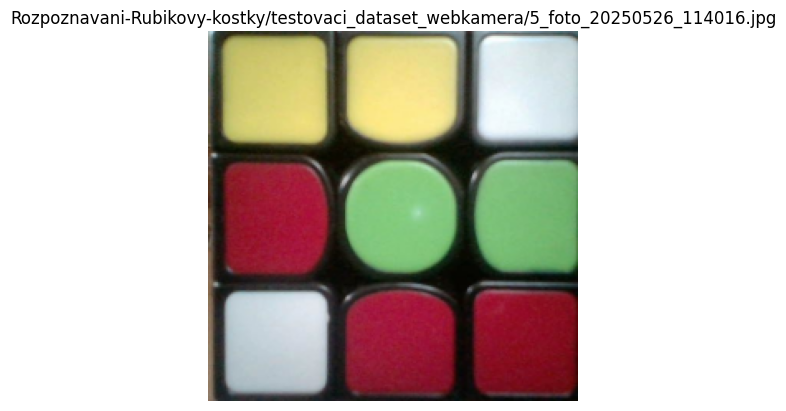

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 95.91% – 🟩 Správně klasifikováno


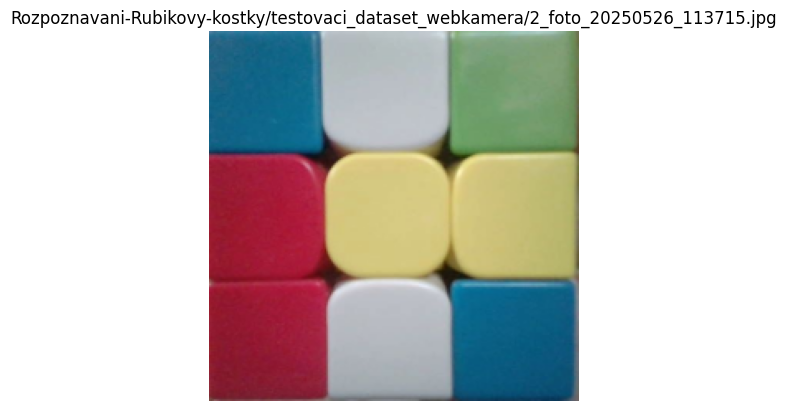

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 99.90% – 🟩 Správně klasifikováno


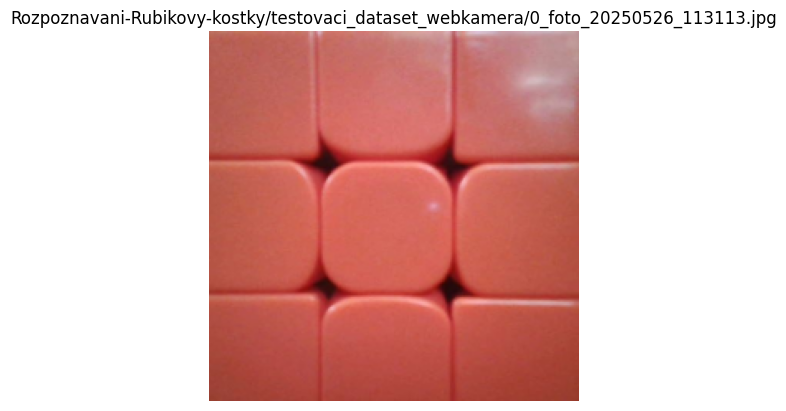

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


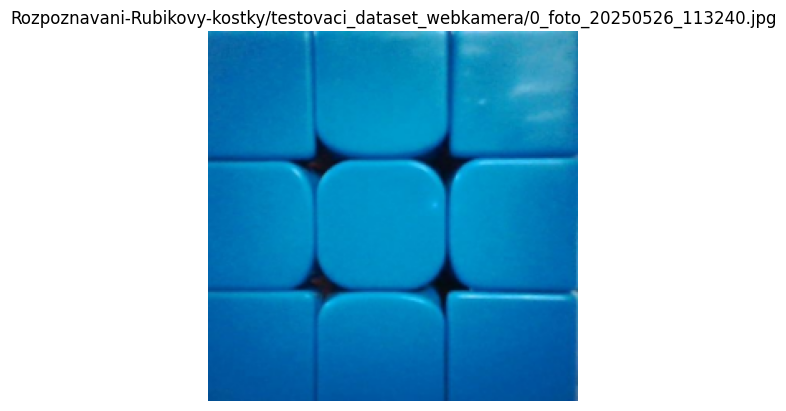

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


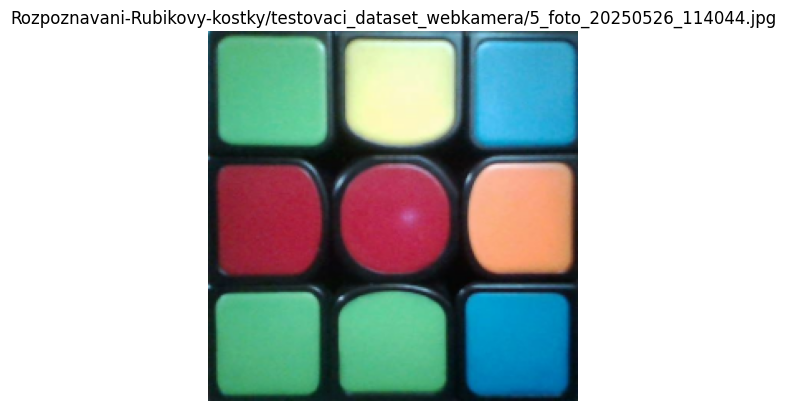

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 62.88% – 🟩 Správně klasifikováno


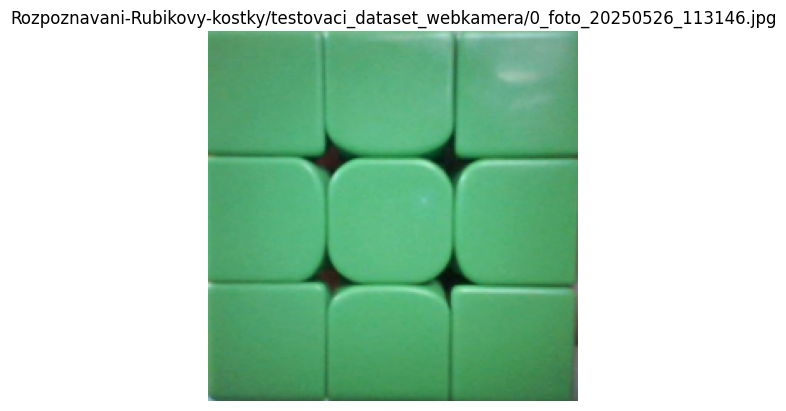

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


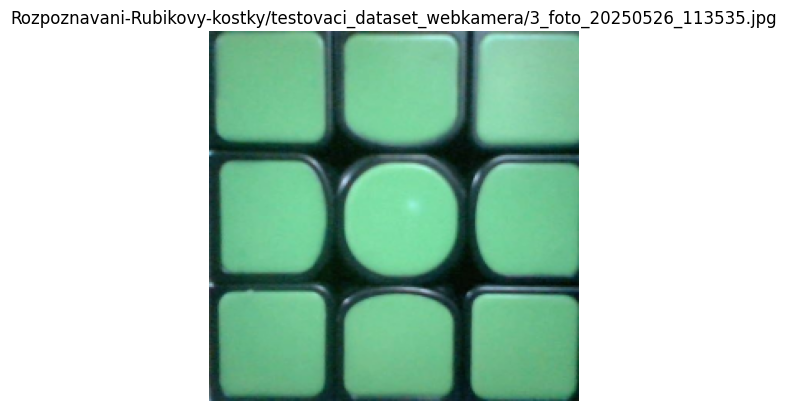

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 98.62% – 🟩 Správně klasifikováno


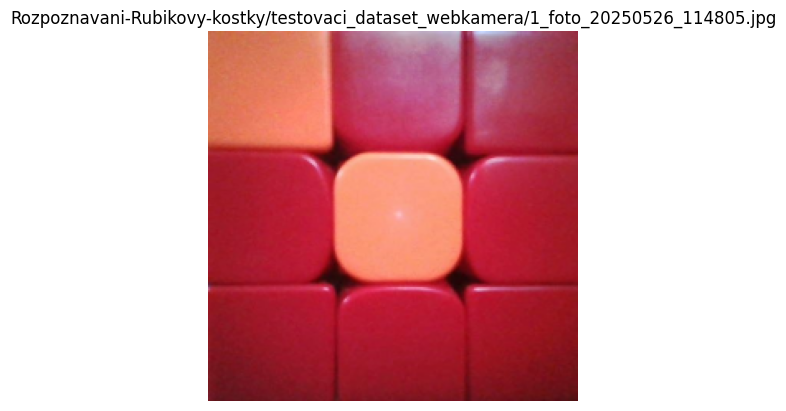

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 99.57% – 🟩 Správně klasifikováno


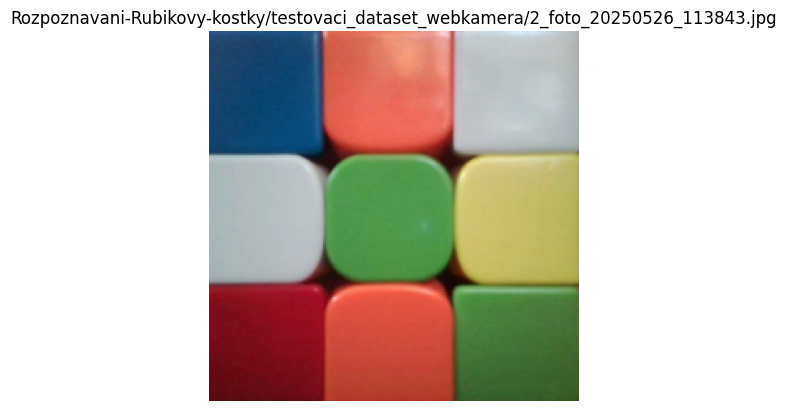

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 99.63% – 🟩 Správně klasifikováno


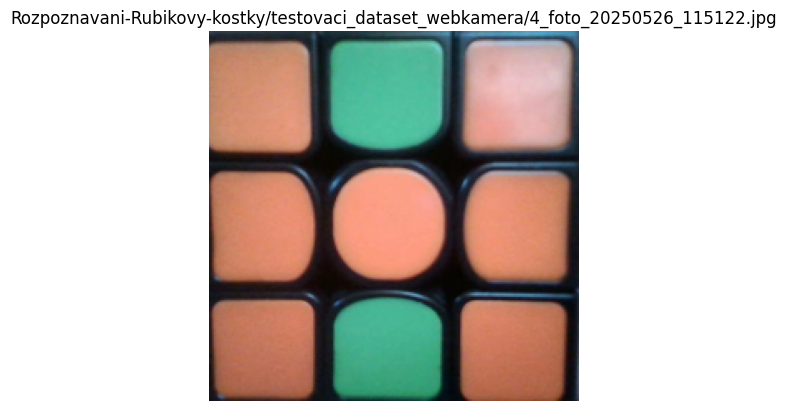

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 98.27% – 🟩 Správně klasifikováno


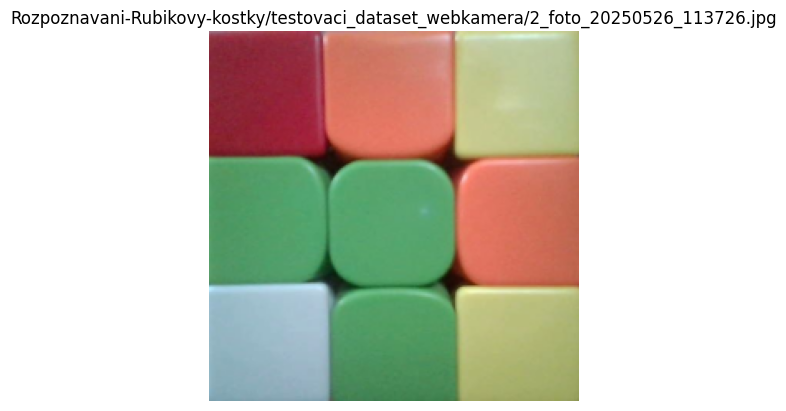

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Správná třída: 2
Predikovaná třída 1 s pravděpodobností 56.34% – 🟥 Špatně klasifikováno


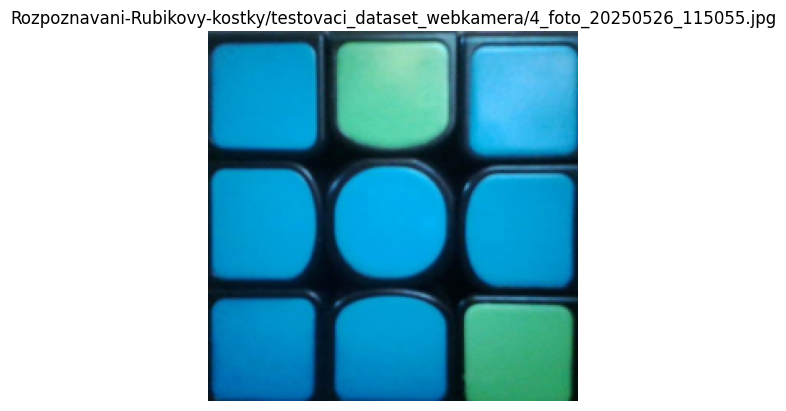

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 99.64% – 🟩 Správně klasifikováno


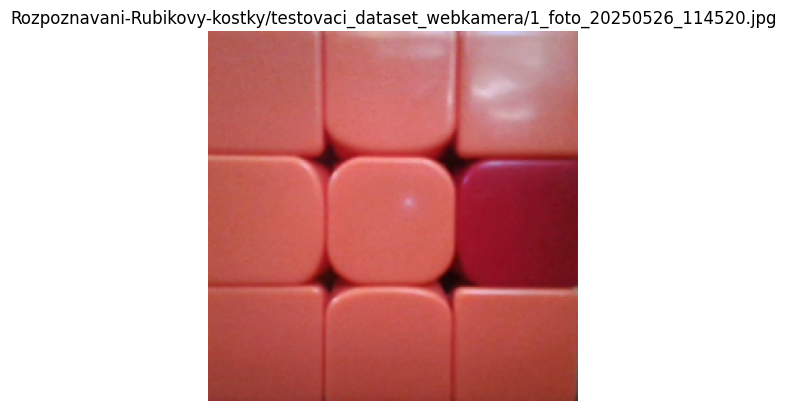

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
Správná třída: 1
Predikovaná třída 0 s pravděpodobností 99.88% – 🟥 Špatně klasifikováno


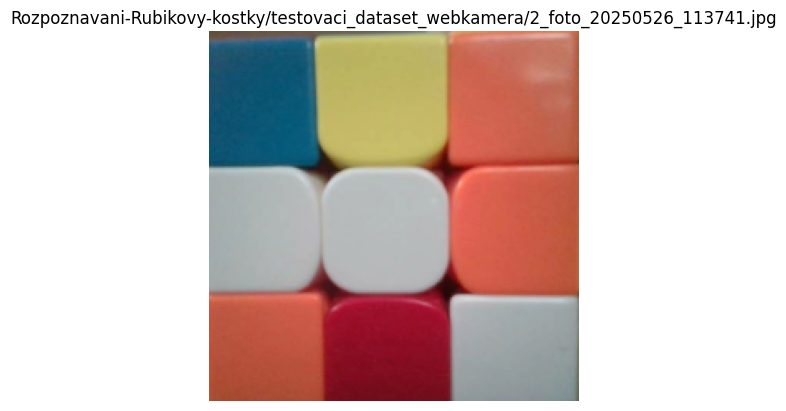

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 98.82% – 🟩 Správně klasifikováno


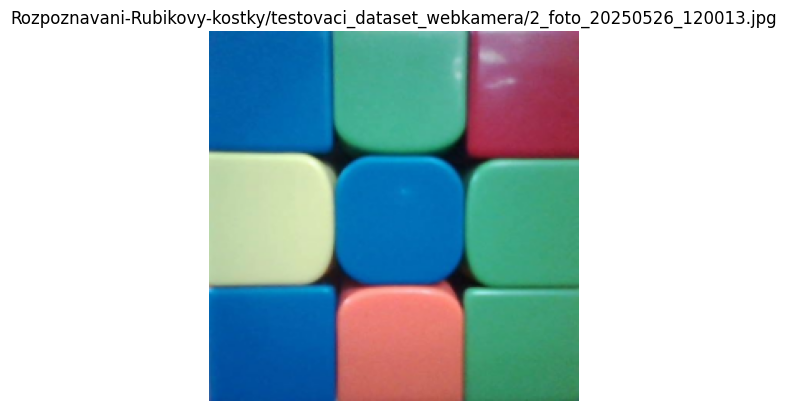

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 99.11% – 🟩 Správně klasifikováno


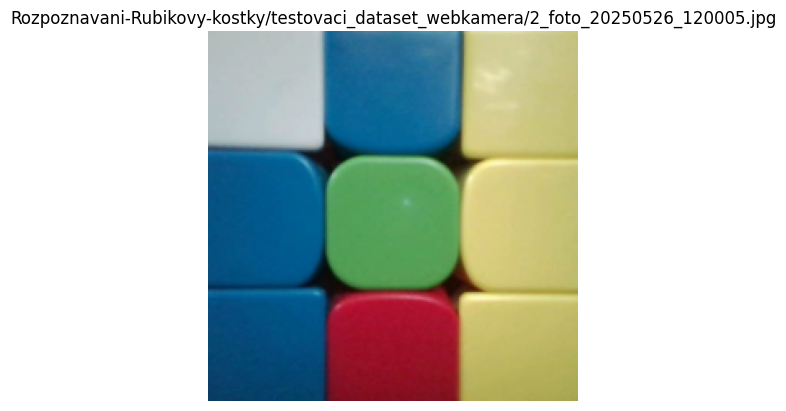

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
Správná třída: 2
Predikovaná třída 2 s pravděpodobností 99.21% – 🟩 Správně klasifikováno


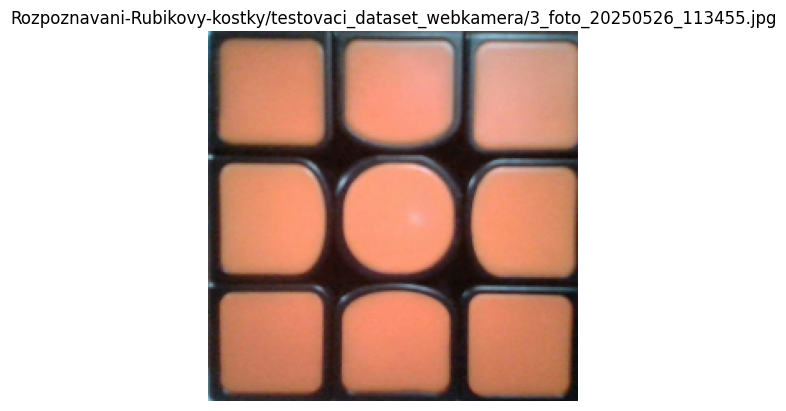

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 99.56% – 🟩 Správně klasifikováno


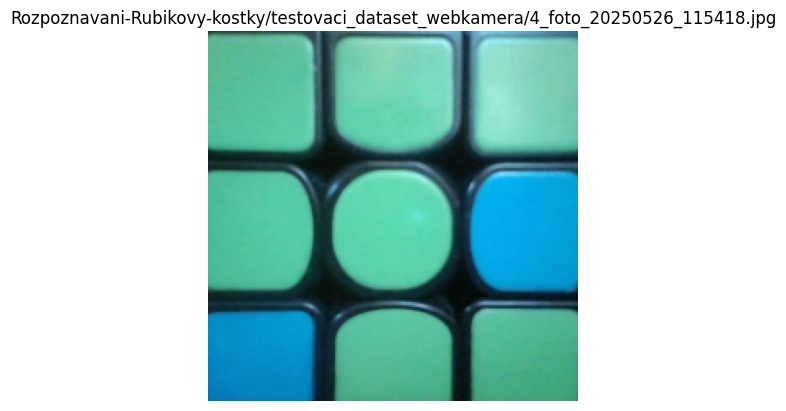

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
Správná třída: 4
Predikovaná třída 4 s pravděpodobností 99.20% – 🟩 Správně klasifikováno


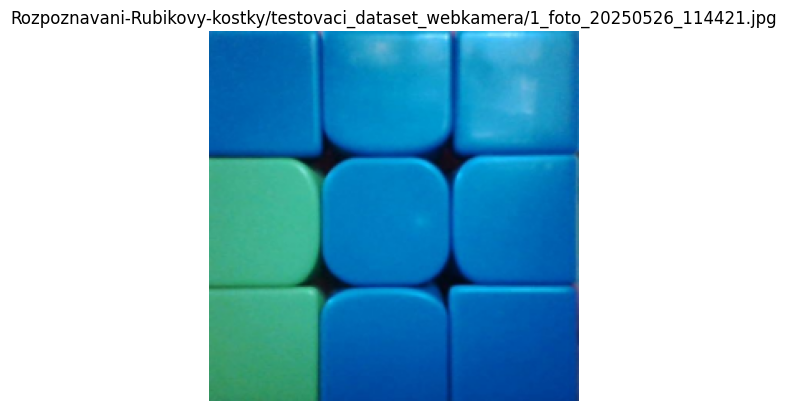

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
Správná třída: 1
Predikovaná třída 0 s pravděpodobností 81.49% – 🟥 Špatně klasifikováno


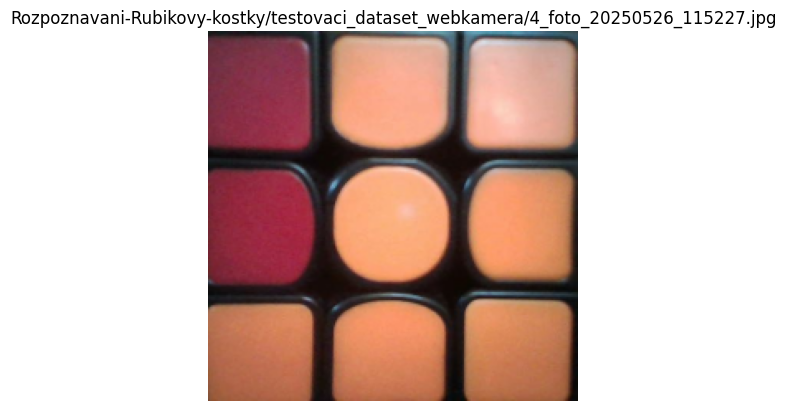

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
Správná třída: 4
Predikovaná třída 3 s pravděpodobností 85.11% – 🟥 Špatně klasifikováno


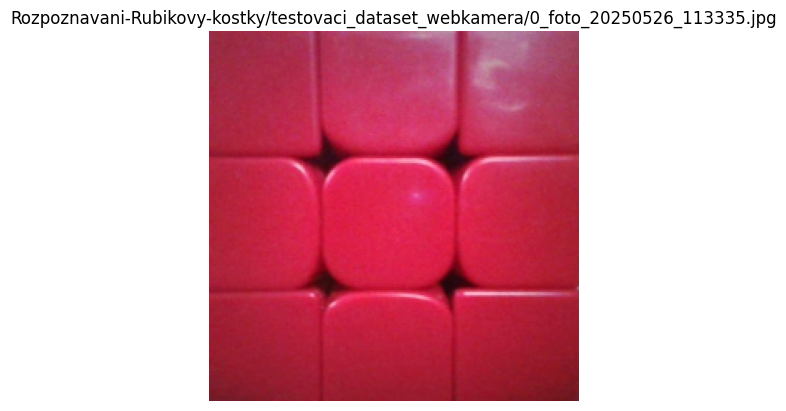

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 100.00% – 🟩 Správně klasifikováno


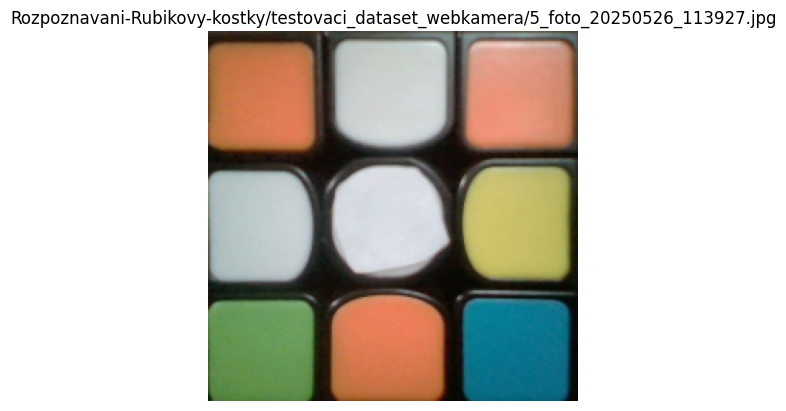

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 73.33% – 🟩 Správně klasifikováno


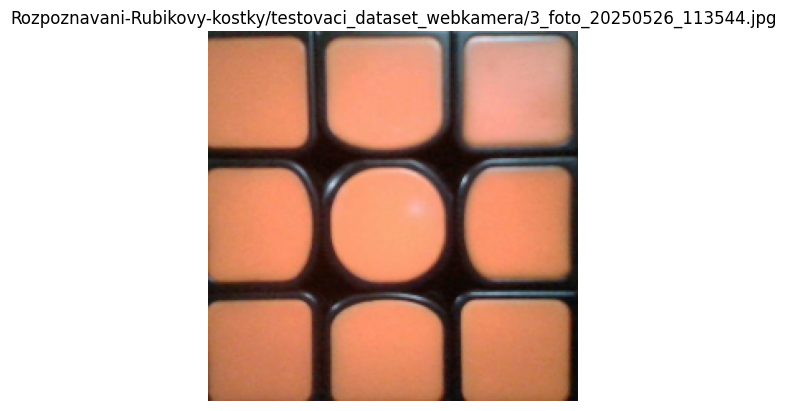

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 98.45% – 🟩 Správně klasifikováno


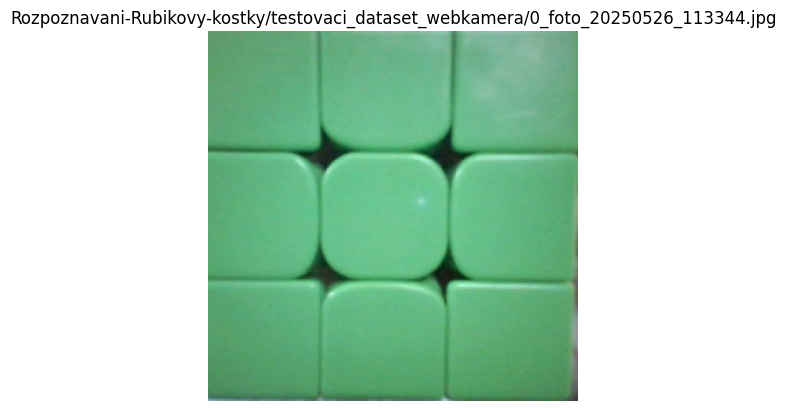

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
Správná třída: 0
Predikovaná třída 0 s pravděpodobností 99.96% – 🟩 Správně klasifikováno


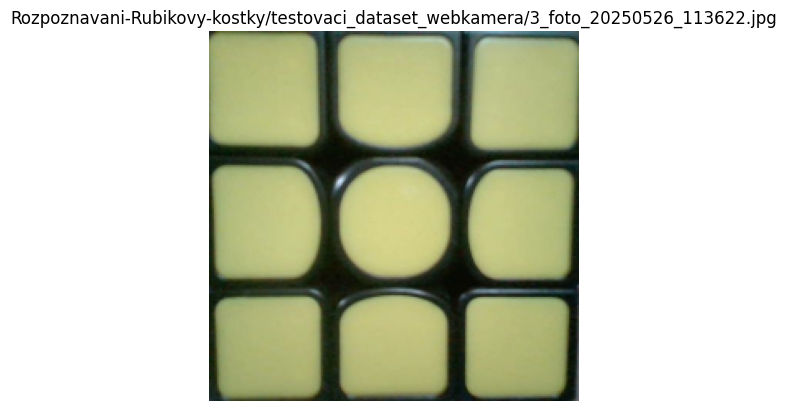

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
Správná třída: 3
Predikovaná třída 3 s pravděpodobností 99.71% – 🟩 Správně klasifikováno


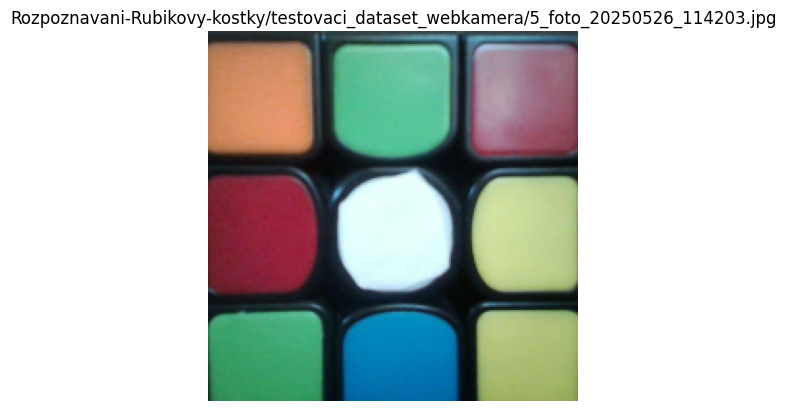

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Správná třída: 5
Predikovaná třída 5 s pravděpodobností 93.01% – 🟩 Správně klasifikováno


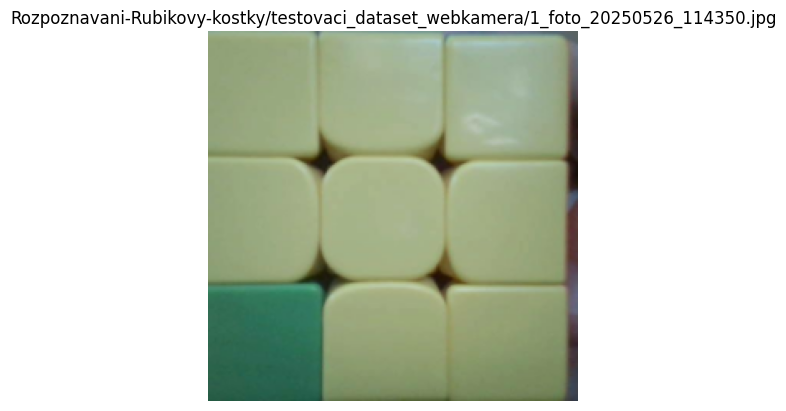

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Správná třída: 1
Predikovaná třída 1 s pravděpodobností 95.70% – 🟩 Správně klasifikováno


In [13]:
# Vypnutí vědecké notace
np.set_printoptions(suppress=True)

# Script kvůli různým verzím kerasu ze StackOverflow
f = h5py.File(model_path, mode="r+")
model_config_string = f.attrs.get("model_config")
if model_config_string.find('"groups": 1,') != -1:
     model_config_string = model_config_string.replace('"groups": 1,', '')
     f.attrs.modify('model_config', model_config_string)
     f.flush()
     model_config_string = f.attrs.get("model_config")
     assert model_config_string.find('"groups": 1,') == -1

f.close()

# Načtení modelu
model = load_model(model_path, compile=False)

# Načtení tříd
class_names = open(labels_path, "r").readlines()

# Správné labely
true_labels = []

# Modelem predikované labely
predicted_labels = []

for image_path in image_paths:
    # Preprocessing
    image, preprocessed = load_and_preprocess_image(image_path)

    # Zobrazení obrázku
    show_image(image, image_path)

    # Získání třídy a její ppsti
    index, confidence = predict_image(model, preprocessed)
    class_name = class_names[index]

    # Skutečná třída
    true_label = get_true_label_from_filename(image_path)

    true_labels.append(true_label)
    predicted_labels.append(index)

    # Výpisy
    print(f"Správná třída: {true_label}")
    print(f"Predikovaná třída {index} s pravděpodobností {confidence:.2%} – {'🟩 Správně klasifikováno' if index == true_label else '🟥 Špatně klasifikováno'}")

cv2.destroyAllWindows()

# Vyhodnocení úspěšnosti


Klasifikační report:
                                      precision    recall  f1-score   support

      0 Stickerless - Složená kostka       0.83      1.00      0.91        10
1 Stickerless - Skoro složená kostka       0.89      0.80      0.84        10
    2 Stickerless - Rozložená kostka       1.00      0.90      0.95        10
          3 Sticker - Složená kostka       0.90      0.90      0.90        10
    4 Sticker - Skoro složená kostka       0.75      0.90      0.82        10
        5 Sticker - Rozložená kostka       1.00      0.80      0.89        10

                            accuracy                           0.88        60
                           macro avg       0.90      0.88      0.88        60
                        weighted avg       0.90      0.88      0.88        60



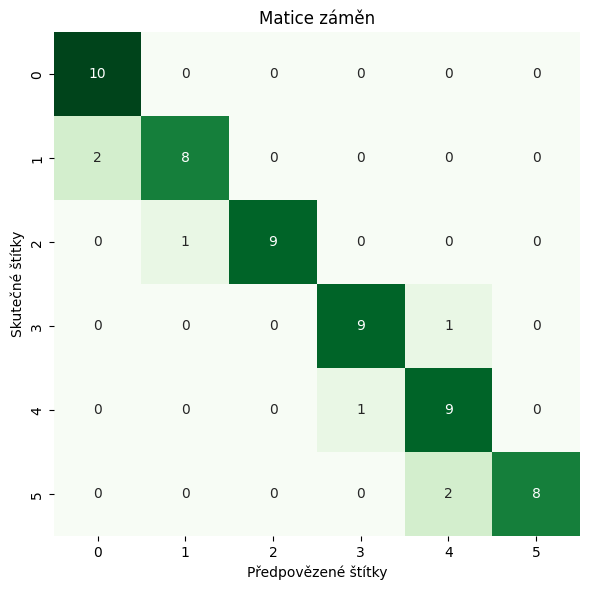

In [14]:
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

# Výpis klasifikačních reportů
print("\nKlasifikační report:")
print(classification_report(true_labels, predicted_labels, target_names=[name.strip() for name in class_names]))

# Vykreslení barevné matice záměn
cm = confusion_matrix(true_labels, predicted_labels)
show_confusion_matrix(cm)

Přesnost na testovacích datech vyfocených stejným zařízením dosahuje 90 %.
Přesnost na testovacích datech z webkamery jen o dvě procenta méně – 88 %, to i přesto, že v trénovacích datech nejsou žádná data z webkamery.
> Poznámka: Při pokusu přidat do trénovacích dat obrázky z webkamery začala přesnost klesat. Kvůli špatné kvalitě se totiž ztrácely rozdíly mezi složenou a skoro složenou třídou. \

Z matice záměn je zřejmé, že nejčastěji si model plete skoro složené strany s rozloženými (což nám v praxi nevadí), dále zaměňuje složenou a skoro složenou stranu. Zde by bylo vhodné provést další vylepšení, pravděpodobně zvětšením trénovací sady.



# Vyzkoušejte si model
Zde je možnost otestovat si náš model rovnou z vaší webkamery.
> Poznámka: Je nutné vaší kameře povolit přístup.

<IPython.core.display.Javascript object>

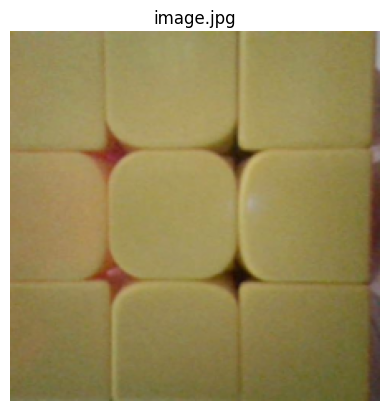

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
Třída 0: Stickerless - Složená kostka
S jistotou: 100 %


In [15]:
image = take_photo()
plt.imshow(image[...,::-1])

cv2.imwrite('/content/image.jpg', image)

# Cestu je možno libovolně změnit.
image_path = 'image.jpg'

image, preprocessed = load_and_preprocess_image(image_path)
show_image(image, image_path)

index, confidence = predict_image(model, preprocessed)
class_name = class_names[index]

# Výpisy
print(f"Třída {index}:", class_name[2:], end="")
print("S jistotou:", str(np.round(confidence * 100))[:-2], "%")